# Feature Engineering Session
Implement and test basic and novel feature engineering ideas.

> Note that **test** is important.

In [1]:
%load_ext autoreload
%autoreload 2
import json
import pickle
from datetime import datetime
from pathlib import Path
from typing import Any, Dict, List, Optional, Union, Tuple

import numpy as np
import pandas as pd
import polars as pl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from polars.testing import assert_series_equal

from metadata import *

pd.options.display.max_columns = None

In [2]:
!cat metadata.py

"""
Project metadata for global access.
Author: JiaWei
"""
# == Data ==
UNIT_ID_COL = "prediction_unit_id"
TGT_COL = "target"
DBI = "data_block_id"
TGT_PK_COLS = ["county", "is_business", "product_type"]
COORD_COL2ABBR = {"latitude": "lat", "longitude": "lon"}
PRODUCT_TYPE2NAME = {0: "Combined", 1: "Fixed", 2: "General service", 3: "Spot"}

# == Join keys ==
CLI_JOIN_KEYS = ["county", "is_business", "product_type", DBI] 
FWTH_JOIN_KEYS = ["county", DBI, "datetime"]  # datetime is the fixed version of forecast_datetime
REVEALED_TGT_JOIN_KEYS = [UNIT_ID_COL, "datetime", "is_consumption"]

# == Temp ==
FIX_FWTH_TIMEZONE = True

In [3]:
RAW_DATA_PATH = Path("./data/raw/")
PROC_DATA_PATH = Path("./data/processed/")

CAST_COUNTY = [pl.col("county").cast(pl.Int8)]
CAST_COORDS = [pl.col("lat").cast(pl.Float32), pl.col("lon").cast(pl.Float32)]

In [4]:
# class CFG:
#     exp_id = datetime.now().strftime("%m%d-%H_%M_%S")
#     exp_dump_path = Path(f"./output/{exp_id}")
    
#     split_tgt_type = True

# CFG.exp_dump_path.mkdir()
# (CFG.exp_dump_path / "models").mkdir()

train = pl.read_csv(RAW_DATA_PATH / "train.csv", try_parse_dates=True)
client = pl.read_csv(RAW_DATA_PATH / "client.csv", try_parse_dates=True)
fwth = pl.read_csv(RAW_DATA_PATH / "forecast_weather.csv", try_parse_dates=True)
train.head(2)

In [7]:
train = train.with_columns(pl.col("datetime").dt.date().alias("date"))

First, `data_block_id` to `date` is **one-to-one**. When we want to predict `2021-09-03`, availability of `client` is summarized as follows,
1. `client` status is from 2 days ago.
2. `client` status is at the level of `date` (day level), not `datetime` (hour level).

`["county", "is_business", "product_type"]` defines the client entity (*i.e.,* `prediction_unit_id`).

In [8]:
print(f"Join `client` features on {CLI_JOIN_KEYS}...")
train = train.join(client, on=CLI_JOIN_KEYS, how="left")
train.head(2)

Join `client` features on ['county', 'is_business', 'product_type', 'data_block_id']...


county,is_business,product_type,target,is_consumption,datetime,data_block_id,row_id,prediction_unit_id,date,eic_count,installed_capacity,date_right
i64,i64,i64,f64,i64,datetime[μs],i64,i64,i64,date,i64,f64,date
0,0,1,0.713,0,2021-09-01 00:00:00,0,0,0,2021-09-01,null,null,null
0,0,1,96.59,1,2021-09-01 00:00:00,0,1,0,2021-09-01,null,null,null


In [8]:
def _get_adj_target(df: pl.DataFrame, adj_base: str = "installed_capacity") -> pl.Series:
    """Derive and return adjusted target.
    
    Args:
        df: DataFrame containing target and adjustment base
        adj_base: adjustment base column
    
    Returns:
        adj_tgt: adjusted target
    """
    adj_tgt = df[TGT_COL] / df[adj_base]
    
    return adj_tgt

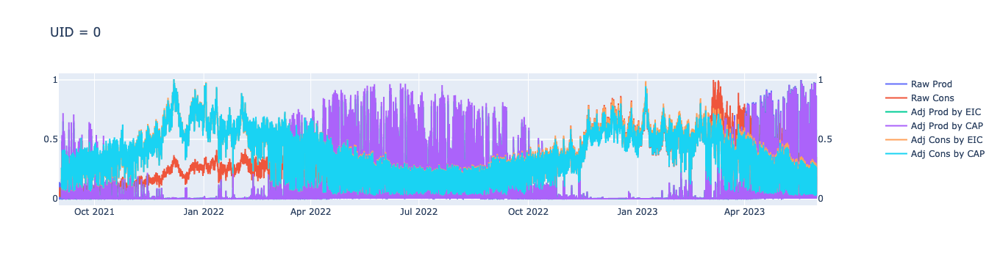

In [8]:
for i in range(1):
    train_ = train.filter(pl.col(UNIT_ID_COL) == i).sort("datetime")
    train_p = train_.filter(pl.col("is_consumption") == 0)
    train_c = train_.filter(pl.col("is_consumption") == 1)
    
    fig = make_subplots(specs=[[{"secondary_y": True}]])
    fig.add_trace(go.Scatter(x=train_p["datetime"], y=train_p[TGT_COL] / train_p[TGT_COL].max(), name="Raw Prod"), secondary_y=False)
    fig.add_trace(go.Scatter(x=train_p["datetime"], y=train_c[TGT_COL] / train_c[TGT_COL].max(), name="Raw Cons"), secondary_y=False)
    adj_prod_by_eic = _get_adj_target(train_p, "eic_count")
    fig.add_trace(go.Scatter(x=train_p["datetime"], y=adj_prod_by_eic / adj_prod_by_eic.max(), name="Adj Prod by EIC"), secondary_y=True)
    adj_prod_by_cap = _get_adj_target(train_p, "installed_capacity")
    fig.add_trace(go.Scatter(x=train_p["datetime"], y=adj_prod_by_cap / adj_prod_by_cap.max(), name="Adj Prod by CAP"), secondary_y=True)
    adj_cons_by_eic = _get_adj_target(train_c, "eic_count")
    fig.add_trace(go.Scatter(x=train_c["datetime"], y=adj_cons_by_eic / adj_cons_by_eic.max(), name="Adj Cons by EIC"), secondary_y=True)
    adj_cons_by_cap = _get_adj_target(train_c, "installed_capacity")
    fig.add_trace(go.Scatter(x=train_c["datetime"], y=adj_cons_by_cap / adj_cons_by_cap.max(), name="Adj Cons by CAP"), secondary_y=True)
    
    fig.update_layout(title=f"UID = {i}")
    fig.show()

## Future Known Features 

### *Single Time Point Identifier*
Identifiers of `datetime` of **the time stamp to forecast**, which can be known beforehand.

In [9]:
tid_feats = [
    pl.col("datetime").dt.quarter().alias("quarter"),
    pl.col("datetime").dt.month().alias("month"),
    pl.col("datetime").dt.day().alias("day"),
    pl.col("datetime").dt.weekday().alias("weekday"),
    pl.col("datetime").dt.hour().alias("hour"),
    # ===
    # Can convert to other encoding (e.g., sin/cos)
    pl.col("datetime").dt.ordinal_day().alias("dayofyear"),
    # ===
]
holiday_feats = []

### *Forecast Weather Features*
Forecast weather features convering the **predicting periods**.

> Because they're forecast, there should exist deviation from the actual values. Also the further, the larger. That is, forecasts for h23 might have larger deviation than h0.

In [10]:
fwth.with_columns(pl.all().is_null()).sum() / len(fwth)

latitude,longitude,origin_datetime,hours_ahead,temperature,dewpoint,cloudcover_high,cloudcover_low,cloudcover_mid,cloudcover_total,10_metre_u_wind_component,10_metre_v_wind_component,data_block_id,forecast_datetime,direct_solar_radiation,surface_solar_radiation_downwards,snowfall,total_precipitation
f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.8402e-7,0.0,0.0


In [11]:
wth_station_latlon2county = (
    pl.read_csv(PROC_DATA_PATH / "wth_station_latlon2county.csv")
    .drop("")
    .rename(COORD_COL2ABBR)
    .with_columns(CAST_COUNTY+CAST_COORDS)
)
wth_station_latlon2county.head()

county,lon,lat
i8,f32,f32
0,24.200001,59.099998
0,25.200001,59.099998
0,23.700001,59.400002
0,24.200001,59.400002
0,24.700001,59.400002


In [12]:
fwth = (
    fwth
    .rename(COORD_COL2ABBR)
    .with_columns(CAST_COORDS)
    .join(wth_station_latlon2county, on=["lat", "lon"], how="left")
)
display(fwth.head(3))
fwth["county"].is_null().sum() / len(fwth)

lat,lon,origin_datetime,hours_ahead,temperature,dewpoint,cloudcover_high,cloudcover_low,cloudcover_mid,cloudcover_total,10_metre_u_wind_component,10_metre_v_wind_component,data_block_id,forecast_datetime,direct_solar_radiation,surface_solar_radiation_downwards,snowfall,total_precipitation,county
f32,f32,"datetime[μs, UTC]",i64,f64,f64,f64,f64,f64,f64,f64,f64,i64,"datetime[μs, UTC]",f64,f64,f64,f64,i8
57.599998,21.700001,2021-08-31 23:00:00 UTC,1,15.655786,11.553613,0.904816,0.019714,0.0,0.905899,-0.411328,-9.106137,1,2021-09-01 00:00:00 UTC,0.0,0.0,0.0,0.0,null
57.599998,22.200001,2021-08-31 23:00:00 UTC,1,13.003931,10.689844,0.886322,0.004456,0.0,0.886658,0.206347,-5.355405,1,2021-09-01 00:00:00 UTC,0.0,0.0,0.0,0.0,null
57.599998,22.700001,2021-08-31 23:00:00 UTC,1,14.206567,11.671777,0.729034,0.005615,0.0,0.730499,1.451587,-7.417905,1,2021-09-01 00:00:00 UTC,0.0,0.0,0.0,0.0,null


0.33035714285714285

These features only consider the feature value **at a time point** agg over spatial dimension. Temporal dimension (*e.g.,* rolling weather features) isn't present here.

* Stats' suffix `_local_mean` means aggregation is done over **stations within each county** (local at county level).

> Same `forcast_datetime` can correspond to different `data_block_id`s.

In [13]:
# ===
# Add other fwth features (e.g., use coord to derive angle and interact with radiation)
cols_to_skip = ["lat", "lon", "origin_datetime", "hours_ahead",
                DBI, "forecast_datetime", "county"]
fwth_feats = [c for c in fwth.columns if c not in cols_to_skip]
# ===

# Which county, which data block id (availability), which predicting horiz
gp_keys = ["county", DBI, "forecast_datetime"]
agg_stats = [
    *[pl.col(feat).mean().alias(f"{feat}_local_mean") for feat in fwth_feats],
    # ===
    # Add other stats
    # ===
]
fwth_stats_by_county = (
    fwth
    .filter(pl.col("county").is_not_null())
    .group_by(gp_keys)
    .agg(agg_stats)
)

In [14]:
fwth_stats_by_county.head(1)

county,data_block_id,forecast_datetime,temperature_local_mean,dewpoint_local_mean,cloudcover_high_local_mean,cloudcover_low_local_mean,cloudcover_mid_local_mean,cloudcover_total_local_mean,10_metre_u_wind_component_local_mean,10_metre_v_wind_component_local_mean,direct_solar_radiation_local_mean,surface_solar_radiation_downwards_local_mean,snowfall_local_mean,total_precipitation_local_mean
i8,i64,"datetime[μs, UTC]",f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
4,1,2021-09-01 00:00:00 UTC,11.647485,9.851007,0.073845,0.34671,0.114063,0.382408,2.643085,-3.50488,0.0,0.0,0.0,0.0


After `replace_time_zone`, we can see that the `datetime` is exactly the same. However, the information about time zone is removed.

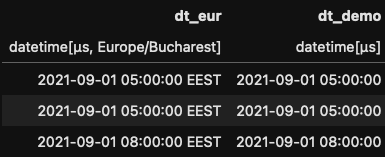

In [15]:
def _fix_time_zone(df_fwth: pl.DataFrame) -> pl.DataFrame:
    """Fix time zone mismatching.
    
    Currently, the mismatching only occurs in `forecast_datetime` of
    forecast weather.
    
    Args:
        df_fwth: DataFrame related to forecast weather
        
    Returns:
        df_fwth: DataFrame with fixed time zone
    """
    df_fwth = (
        df_fwth.with_columns(
            pl.col("forecast_datetime").dt
            .convert_time_zone("Europe/Bucharest").alias("datetime").dt
            .replace_time_zone(None).cast(pl.Datetime("us"))
        )
        .drop("forecast_datetime")
    )
    
    return df_fwth

# Check the effect of `replace_time_zone`
# fwth_stats_by_county = fwth_stats_by_county.with_columns(
#     pl.col("forecast_datetime").dt.convert_time_zone("Europe/Bucharest").alias("dt_eur")
# )
# fwth_stats_by_county = fwth_stats_by_county.with_columns(
#     pl.col("dt_eur").dt.replace_time_zone(None).alias("dt_demo")
# )
# dt_compare = fwth_stats_by_county.select(["dt_eur", "dt_demo"])
# assert_series_equal(dt_compare["dt_eur"].dt.date(), dt_compare["dt_eur"].dt.date(), check_names=False)
# assert_series_equal(dt_compare["dt_eur"].dt.time(), dt_compare["dt_eur"].dt.time(), check_names=False)

In [16]:
if FIX_FWTH_TIMEZONE:
    fwth_stats_by_county = _fix_time_zone(fwth_stats_by_county)
fwth_stats_by_county.head(2)

county,data_block_id,temperature_local_mean,dewpoint_local_mean,cloudcover_high_local_mean,cloudcover_low_local_mean,cloudcover_mid_local_mean,cloudcover_total_local_mean,10_metre_u_wind_component_local_mean,10_metre_v_wind_component_local_mean,direct_solar_radiation_local_mean,surface_solar_radiation_downwards_local_mean,snowfall_local_mean,total_precipitation_local_mean,datetime
i8,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,datetime[μs]
4,1,11.647485,9.851007,0.073845,0.34671,0.114063,0.382408,2.643085,-3.50488,0.0,0.0,0.0,0.0,2021-09-01 03:00:00
14,1,12.137394,9.46849,0.014221,0.137817,0.017181,0.152476,1.8526,-3.626267,0.0,0.0,0.0,0.000002,2021-09-01 05:00:00


<div class="alert alert-block alert-danger"> 
    County 12 has no weather stations.
</dib>

In [17]:
# dt_debug = datetime(2022, 10, 31, 14, 0)
# print(fwth_stats_by_county.filter(pl.col("datetime") == dt_debug)["county"].n_unique())
# train["county"].n_unique()  # 16

## Historical Observed Features

### *Revealed (Lagging) Targets*
Historical observed electricity production / consumption itself. It's commonly used in time series models (*e.g.,* ARIMA, SOTA DL models).

#### Tips about Target Shifting
Fixing `datetime` as one of the join keys, we have to ways to reveal historical targets,
1. Add lagging amount to `datetime` itself and join, which means joining this target entry (history) to the future time point (adjusted `datetime`).
    * No `NaN` appears when targets are (pseudo) shifted.
    * Can be thought of as a shift-free method from the target entries themselves.
2. Shift target itself by the lagging amount. The beginning target entries become `NaN`.

In [18]:
class RevealedTargetFE(object):
    """Feature engineer considering lookback targets.
    
    Args:
        n_days_to_look: number of lookback days, starting at 2 days
        look_closest_hours: if True, the closest revealed targets are
            taken as day encoding
    """
    
    BASE_LOOKBACK_DAY: int = 2
    BASE_LOOKBACK_HOUR: int = 25
    DAY_ENC_DIM: int = 23  # Closet hour-gap revealed targets
    JOIN_KEY: List[int] = ["datetime", UNIT_ID_COL, "is_consumption"]
    
    def __init__(
        self, 
        n_days_to_look: int = 6,
        look_closest_hours: bool = True
    ) -> None:
        self.n_days_to_look = n_days_to_look
        self.look_closest_hours = look_closest_hours
        
        self._lookback_dcols = [f"y_lag{d+self.BASE_LOOKBACK_DAY}d" for d in range(n_days_to_look)]
        if look_closest_hours:
            self._lookback_hcols = [f"y_lag{h+self.BASE_LOOKBACK_HOUR}h" for h in range(self.DAY_ENC_DIM)]
        else:
            self._lookback_hcols = []
        self._feats = self._lookback_dcols + self._lookback_hcols
    
    @property
    def feats(self) -> List[str]:
        return self._feats
    
    def run(self, df_y: pl.DataFrame) -> pl.LazyFrame:
        """Run feature engineering
        
        Args:
            df_y: DataFrame containing target information
            
        Returns:
            df_y_lookback: DataFrame containing revealed targets as
                features
        """
        df_y_raw = df_y.lazy()
        df_y_lookback = df_y.lazy()
        

        # No need to shift base lookback (2 day here)
        df_y_lookback = df_y_lookback.with_columns(pl.col(TGT_COL).alias(self._lookback_dcols[0]))
        for d, feat in zip(range(1, self.n_days_to_look), self._lookback_dcols[1:]):
            df_y_shifted = (
                df_y_raw
                .with_columns((pl.col("datetime") + pl.duration(days=d)).alias("datetime"))
                .rename({TGT_COL: feat})
            )
            df_y_lookback = df_y_lookback.join(df_y_shifted, on=self.JOIN_KEY, how="left")
        # Add base lookback day as base common shift
        df_y_lookback = df_y_lookback.with_columns([
            (pl.col("datetime") + pl.duration(days=self.BASE_LOOKBACK_DAY)).alias("datetime_d")
        ])
        
        if self.look_closest_hours:
            # No need to shift base lookback (25 hour here)
            df_y_lookback = df_y_lookback.with_columns(pl.col(TGT_COL).alias(self._lookback_hcols[0]))
            for h, feat in zip(range(1, self.DAY_ENC_DIM), self._lookback_hcols[1:]):
                df_y_shifted = (
                    df_y_raw
                    .with_columns((pl.col("datetime") + pl.duration(hours=h)).alias("datetime"))
                    .rename({TGT_COL: feat})
                )
                df_y_lookback = df_y_lookback.join(df_y_shifted, on=self.JOIN_KEY, how="left")
            # Add base lookback hour as base common shift
            df_y_lookback = df_y_lookback.with_columns([
                (pl.col("datetime") + pl.duration(hours=self.BASE_LOOKBACK_HOUR)).alias("datetime_h")
            ])

        df_y_lookback = df_y_lookback.drop(TGT_COL)

        return df_y_lookback

# Check if the frist shift (target shift for the base day/hour) can be skip
# Pass#
# df_y_lookback = df_y_lookback.collect()
# assert_series_equal(df_y_lookback[TGT_COL], df_y_lookback["y_lag2d"], check_names=False)
# assert_series_equal(df_y_lookback[TGT_COL], df_y_lookback["y_lag25h"], check_names=False)

In [19]:
revealed_target_fe = RevealedTargetFE(n_days_to_look=6, look_closest_hours=False)
df_y_lookback = revealed_target_fe.run(train.select([UNIT_ID_COL, "datetime", TGT_COL, "is_consumption"]))
print(f"Naive revealed targets as features: {revealed_target_fe.feats}")

Naive revealed targets as features: ['y_lag2d', 'y_lag3d', 'y_lag4d', 'y_lag5d', 'y_lag6d', 'y_lag7d']


## Prepare Data

It's obvious we have some missing values to handle,
1. `null` in `fwth_stats_by_county` falls into the following categories,
    * `county == 12`: No weather stations are mapped to county 12 (*i.e.,* `unknown`)
    * `date_block_id == 0`: Forecast weather data starts from `data_block_id == 1`
    * `data_block_id == 207 or 571`: `2022-03-27 03:00:00` and `2023-03-26 03:00:00`, related to daylight hours
2. `null` in other features are mainly because of the shifting or data availability.

<div class="alert alert-block alert-danger">
    Another important issue is that number of rows increasese after joining with `fwth_stats_by_county`. The reason behind the scene is that `fwth` has something weird to be figure out on date `2021-10-31 03:00:00` and `2022-10-30 03:00:00`. Now, because those days have null targets, which will be dropped, let's skip them and come back later.
</div>

In [50]:
df = (
    train.lazy()
    .with_columns(CAST_COUNTY)
    # Add features below
    .with_columns(tid_feats)
    .join((
        df_y_lookback
        .drop("datetime")
        .rename({"datetime_d": "datetime"})
    ), on=REVEALED_TGT_JOIN_KEYS, how="left")
    .join(fwth_stats_by_county.lazy(), on=FWTH_JOIN_KEYS, how="left")
).collect().to_pandas()
# df[df[[UNIT_ID_COL, DBI, "datetime", "is_consumption"]].duplicated()][TGT_COL].isna().all()  # True

In [87]:
# df_demo = df.filter((pl.col("temperature_local_mean").is_null()) & (pl.col("county") != 12))
# df_demo[DBI].unique()

data_block_id
i64
0
207
571


In [52]:
# df.to_parquet(PROC_DATA_PATH / "data.parquet")

Missing targets are all those from **daylight saving hours**,
1. `2021-10-31 03:00:00`: Can consider imputing the targets
2. `2022-03-27 03:00:00`
3. `2022-10-30 03:00:00`: Can consider imputing the targets
4. `2023-03-26 03:00:00`

See https://www.kaggle.com/competitions/predict-energy-behavior-of-prosumers/discussion/460529

In [92]:
(df.isna().sum() / len(df)).sort_values()

county                                          0.000000
hour                                            0.000000
weekday                                         0.000000
day                                             0.000000
month                                           0.000000
quarter                                         0.000000
date                                            0.000000
prediction_unit_id                              0.000000
dayofyear                                       0.000000
data_block_id                                   0.000000
datetime                                        0.000000
is_consumption                                  0.000000
product_type                                    0.000000
is_business                                     0.000000
row_id                                          0.000000
target                                          0.000389
eic_count                                       0.004280
installed_capacity             

In [94]:
df[df[TGT_COL].isna()]["datetime"].unique()

<DatetimeArray>
['2021-10-31 03:00:00', '2022-03-27 03:00:00', '2022-10-30 03:00:00',
 '2023-03-26 03:00:00']
Length: 4, dtype: datetime64[ns]

In [19]:
df = df[df[TGT_COL].notna()].reset_index(drop=True)
df.head()

,county,is_business,product_type,target,is_consumption,datetime,data_block_id,row_id,prediction_unit_id,date,eic_count,installed_capacity,date_right,quarter,month,day,weekday,hour,dayofyear,y_lag2d,y_lag3d,y_lag4d,y_lag5d,y_lag6d,y_lag7d,temperature_local_mean,dewpoint_local_mean,cloudcover_high_local_mean,cloudcover_low_local_mean,cloudcover_mid_local_mean,cloudcover_total_local_mean,10_metre_u_wind_component_local_mean,10_metre_v_wind_component_local_mean,direct_solar_radiation_local_mean,surface_solar_radiation_downwards_local_mean,snowfall_local_mean,total_precipitation_local_mean
0,0,0,1,0.713,0,2021-09-01,0,0,0,2021-09-01,NaN,NaN,NaT,3,9,1,3,0,244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,0,1,96.590,1,2021-09-01,0,1,0,2021-09-01,NaN,NaN,NaT,3,9,1,3,0,244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,0,2,0.000,0,2021-09-01,0,2,1,2021-09-01,NaN,NaN,NaT,3,9,1,3,0,244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,0,2,17.314,1,2021-09-01,0,3,1,2021-09-01,NaN,NaN,NaT,3,9,1,3,0,244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,0,3,2.904,0,2021-09-01,0,4,2,2021-09-01,NaN,NaN,NaT,3,9,1,3,0,244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [54]:
feats = (
    TGT_PK_COLS
    # Client
    + ["eic_count", "installed_capacity"]
    # Time identifiers
    + ["quarter", "month", "day", "weekday", "hour", "dayofyear"]
    # Revealed targets
    + revealed_target_fe.feats
    # Forecast weather (local)
    + [c for c in fwth_stats_by_county.columns if c.endswith("local_mean")]
)
if CFG.split_tgt_type:
    feats += ["is_consumption"]
feats

['county',
 'is_business',
 'product_type',
 'eic_count',
 'installed_capacity',
 'quarter',
 'month',
 'day',
 'weekday',
 'hour',
 'dayofyear',
 'y_lag2d',
 'y_lag3d',
 'y_lag4d',
 'y_lag5d',
 'y_lag6d',
 'y_lag7d',
 'temperature_local_mean',
 'dewpoint_local_mean',
 'cloudcover_high_local_mean',
 'cloudcover_low_local_mean',
 'cloudcover_mid_local_mean',
 'cloudcover_total_local_mean',
 '10_metre_u_wind_component_local_mean',
 '10_metre_v_wind_component_local_mean',
 'direct_solar_radiation_local_mean',
 'surface_solar_radiation_downwards_local_mean',
 'snowfall_local_mean',
 'total_precipitation_local_mean',
 'is_consumption']

In [55]:
with open(PROC_DATA_PATH / "feats/v1.txt", "w") as f:
    for feat in feats:
        f.write(f"{feat}\n")

In [21]:
X, y = df[feats], df[TGT_COL]
print(f"Data shape: X {X.shape}, y {y.shape}")

Data shape: X (2017824, 30), y (2017824,)


## Local CV

1. `GroupKFold` with `prediction_unit_id` as group.

In [23]:
from sklearn.model_selection import GroupKFold
from sklearn.metrics import mean_absolute_error
from xgboost import XGBRegressor

from utils.traits import is_gbdt_instance

In [25]:
def _split_tgt_type(X: pd.DataFrame, y: pd.Series) -> Tuple[pd.DataFrame, pd.Series]:
    """Split datasetes by target type."""
    cons_mask = (X["is_consumption"] == 1)
    X_prod, X_cons = X[~cons_mask].drop("is_consumption", axis=1), X[cons_mask].drop("is_consumption", axis=1)
    y_prod, y_cons = y[X_prod.index], y[X_cons.index]
    assert y_prod.notna().all() and y_cons.notna().all()
    
    return X_prod, X_cons, y_prod, y_cons

In [26]:
xgb_params = {
    "model": {
        "n_estimators": 2500, #20000,
        "max_depth": 15,
        "learning_rate": 0.01,
        "subsample": 0.8,
        "colsample_bytree": 0.8,
        "min_child_weight": 32,
        "reg_lambda": 2,
        "eval_metric": "mae",
        "tree_method": "gpu_hist",
        "seed": 42,
        # 
        "early_stopping_rounds": 50
    },
    "fit": {
        "verbose": 250,
    }
}

<div class="alert alert-block alert-warning">
    Though no ES is used, but still pred with the best ckpt...
</div>

In [27]:
def _log_prfs(prfs: Dict[str, Any]) -> None:
    """Log dict-like performance."""
    print(f">>>>> Performance Report <<<<<")    
    print(json.dumps(prfs, indent=4))

In [28]:
n_folds = 5
cv = GroupKFold(n_folds)
groups = df[UNIT_ID_COL]

if CFG.split_tgt_type:
    models = {
        "prod": [XGBRegressor(**xgb_params["model"]) for _ in range(n_folds)],
        "cons": [XGBRegressor(**xgb_params["model"]) for _ in range(n_folds)],
    }
    prfs = {"prod": [], "cons": []}
else:
    models = [XGBRegressor(**xgb_params["model"]) for _ in range(n_folds)]
    prfs = []
    
oof = np.zeros((len(X), ))
for fold, (tr_idx, val_idx) in enumerate(cv.split(X=X, groups=groups)):
    print(f"===== Fold{fold} =====")
    X_tr, X_val = X.iloc[tr_idx, :], X.iloc[val_idx, :]
    y_tr, y_val = y.iloc[tr_idx], y.iloc[val_idx]
    
    if CFG.split_tgt_type:
        X_tr_prod, X_tr_cons, y_tr_prod, y_tr_cons = _split_tgt_type(X_tr, y_tr)
        X_val_prod, X_val_cons, y_val_prod, y_val_cons = _split_tgt_type(X_val, y_val)

    fit_params = xgb_params["fit"].copy()
    
    if CFG.split_tgt_type:
        # Production models
        if is_gbdt_instance(models["prod"][fold], ["lgbm", "xgb", "cat"]):
            fit_params["eval_set"] = [(X_tr_prod, y_tr_prod), (X_val_prod, y_val_prod)]

            # Add categorical features...
        print("Train production model...")
        models["prod"][fold].fit(X_tr_prod, y_tr_prod, **fit_params)

        y_pred_tmp = np.clip(models["prod"][fold].predict(X_val_prod), 0, np.inf)
        oof[X_val_prod.index] = y_pred_tmp
        prfs["prod"].append(mean_absolute_error(y_val_prod, y_pred_tmp))

        # Consumption models
        if is_gbdt_instance(models["cons"][fold], ["lgbm", "xgb", "cat"]):
            fit_params["eval_set"] = [(X_tr_cons, y_tr_cons), (X_val_cons, y_val_cons)]

            # Add categorical features...
        print("Train consumption model...")
        models["cons"][fold].fit(X_tr_cons, y_tr_cons, **fit_params)

        y_pred_tmp = np.clip(models["cons"][fold].predict(X_val_cons), 0, np.inf)
        oof[X_val_cons.index] = y_pred_tmp
        prfs["cons"].append(mean_absolute_error(y_val_cons, y_pred_tmp))
    else:
        if is_gbdt_instance(models[fold], ["lgbm", "xgb", "cat"]):
            fit_params["eval_set"] = [(X_tr, y_tr), (X_val, y_val)]

            # Add categorical features...
        print("Train mix model...")
        models[fold].fit(X_tr, y_tr, **fit_params)

        y_pred_tmp = np.clip(models[fold].predict(X_val), 0, np.inf)
        oof[X_val.index] = y_pred_tmp
        prfs.append(mean_absolute_error(y_val, y_pred_tmp))
_log_prfs(prfs)

===== Fold0 =====
Train production model...
[0]	validation_0-mae:76.74066	validation_1-mae:133.69675
[250]	validation_0-mae:16.66274	validation_1-mae:43.99036
[500]	validation_0-mae:11.97692	validation_1-mae:40.24025
[593]	validation_0-mae:11.42929	validation_1-mae:40.27562
Train consumption model...
[0]	validation_0-mae:456.11761	validation_1-mae:453.24307
[250]	validation_0-mae:50.84519	validation_1-mae:102.39595
[448]	validation_0-mae:27.93009	validation_1-mae:97.20123
===== Fold1 =====
Train production model...
[0]	validation_0-mae:95.70408	validation_1-mae:56.96540
[250]	validation_0-mae:20.15073	validation_1-mae:16.56951
[500]	validation_0-mae:14.12775	validation_1-mae:15.14455
[750]	validation_0-mae:12.70418	validation_1-mae:14.91823
[1000]	validation_0-mae:11.77693	validation_1-mae:14.77294
[1250]	validation_0-mae:10.92854	validation_1-mae:14.58121
[1500]	validation_0-mae:10.19299	validation_1-mae:14.41254
[1701]	validation_0-mae:9.69449	validation_1-mae:14.41980
Train consumpt

In [29]:
for k, v in prfs.items():
    print(k)
    print(np.mean(v), np.std(v))

prod
25.64819960542389 13.061995171300433
cons
163.94627609102173 230.12345483911494


In [31]:
(25.648 + 163.946) / 2

94.797

In [40]:
np.mean(prfs), np.std(prfs)

(97.13567680542175, 116.88051430369643)

In [32]:
with open(CFG.exp_dump_path / "models/model.pkl", "wb") as f:
    pickle.dump(models, f)

In [33]:
with open(CFG.exp_dump_path / "feats.txt", "w") as f:
    for feat in feats:
        f.write(f"{feat}\n")

In [35]:
np.save(CFG.exp_dump_path / "oof.npy", oof)

In [43]:
import pickle
with open("./output/1214-04_14_15/models/model.pkl", "rb") as f:
    models = pickle.load(f)
models

[XGBRegressor(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, early_stopping_rounds=50,
              enable_categorical=False, eval_metric='mae', feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=15, max_leaves=None,
              min_child_weight=32, missing=nan, monotone_constraints=None,
              n_estimators=2500, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...),
 XGBRegressor(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, early_stopping_rounds=50,
              enable_categorical=False, eval_metric='mae', feature_t

In [44]:
for fold, model in enumerate(models):
    with open(f"./output/1214-04_14_15/models/model_fold{fold}.pkl", "wb") as f:
        pickle.dump(model, f)

In [65]:
with open("./output/1214-04_21_50/models/model.pkl", "rb") as f:
    models = pickle.load(f)
models

{'prod': [XGBRegressor(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=0.8, early_stopping_rounds=50,
               enable_categorical=False, eval_metric='mae', feature_types=None,
               gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
               interaction_constraints=None, learning_rate=0.01, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=15, max_leaves=None,
               min_child_weight=32, missing=nan, monotone_constraints=None,
               n_estimators=2500, n_jobs=None, num_parallel_tree=None,
               predictor=None, random_state=None, ...),
  XGBRegressor(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=0.8, early_stopping_rounds=50,
               enable_categorical=False, eval_

In [66]:
fold = np.zeros((len(X), ))
for i, (tr_idx, val_idx) in enumerate(cv.split(X=X, groups=groups)):
    fold[val_idx] = i
fold

array([3., 3., 1., ..., 2., 1., 1.])

In [67]:
df.head()

,county,is_business,product_type,target,is_consumption,datetime,data_block_id,row_id,prediction_unit_id,date,eic_count,installed_capacity,date_right,quarter,month,day,weekday,hour,dayofyear,y_lag2d,y_lag3d,y_lag4d,y_lag5d,y_lag6d,y_lag7d,temperature_local_mean,dewpoint_local_mean,cloudcover_high_local_mean,cloudcover_low_local_mean,cloudcover_mid_local_mean,cloudcover_total_local_mean,10_metre_u_wind_component_local_mean,10_metre_v_wind_component_local_mean,direct_solar_radiation_local_mean,surface_solar_radiation_downwards_local_mean,snowfall_local_mean,total_precipitation_local_mean
0,0,0,1,0.713,0,2021-09-01,0,0,0,2021-09-01,NaN,NaN,NaT,3,9,1,3,0,244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,0,1,96.590,1,2021-09-01,0,1,0,2021-09-01,NaN,NaN,NaT,3,9,1,3,0,244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,0,2,0.000,0,2021-09-01,0,2,1,2021-09-01,NaN,NaN,NaT,3,9,1,3,0,244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,0,2,17.314,1,2021-09-01,0,3,1,2021-09-01,NaN,NaN,NaT,3,9,1,3,0,244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,0,3,2.904,0,2021-09-01,0,4,2,2021-09-01,NaN,NaN,NaT,3,9,1,3,0,244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [68]:
df["fold"] = fold
df["oof"] = np.load("./output/1214-04_21_50/oof.npy")

In [70]:
df.groupby("fold").apply(lambda x: mean_absolute_error(x[TGT_COL], x["oof"]))

fold
0.0     68.677099
1.0     20.281506
2.0    332.097833
3.0     25.373009
4.0     27.556742
dtype: float64

In [35]:
[76.68672778081613,
 23.402032899500362,
 327.68323739592637,
 28.41307125719237,
 29.493314693673483]



[76.68672778081613,
 23.402032899500362,
 327.68323739592637,
 28.41307125719237,
 29.493314693673483]

In [30]:
models = []
model_path = Path("./output/1214-04_14_15/models/")
for model_file in sorted(model_path.glob("*.pkl")):
    print(model_file)
    with open(model_file, "rb") as f:
        models.append(pickle.load(f))
models

output/1214-04_14_15/models/model_fold0.pkl
output/1214-04_14_15/models/model_fold1.pkl
output/1214-04_14_15/models/model_fold2.pkl
output/1214-04_14_15/models/model_fold3.pkl
output/1214-04_14_15/models/model_fold4.pkl


[XGBRegressor(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, early_stopping_rounds=50,
              enable_categorical=False, eval_metric='mae', feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=15, max_leaves=None,
              min_child_weight=32, missing=nan, monotone_constraints=None,
              n_estimators=2500, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...),
 XGBRegressor(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, early_stopping_rounds=50,
              enable_categorical=False, eval_metric='mae', feature_t

In [33]:
prfs = []
cv = GroupKFold(5)
# X.drop("is_consumption", axis=1, inplace=True)
for fold, (_, val_idx) in enumerate(cv.split(X, groups=df[UNIT_ID_COL])):
    X_val, y_val = X.iloc[val_idx, :], y.iloc[val_idx]
    y_pred = np.clip(models[fold].predict(X_val), 0, np.inf)
    prfs.append(mean_absolute_error(y_val, y_pred))

In [34]:
prfs

[76.68672778081613,
 23.402032899500362,
 327.68323739592637,
 28.41307125719237,
 29.493314693673483]

In [36]:
np.mean(prfs)

97.13567680542175

In [37]:
np.std(prfs)

116.88051430369643

In [38]:
prfs2 = [
68.677099,    20.281506,   332.097833
,   25.373009
,   27.556742]

In [39]:
np.mean(prfs2), np.std(prfs2)

(94.79723779999999, 119.9061601743627)

In [46]:
models[0].feature_importances_

array([1.7294487e-03, 8.1902149e-04, 4.8050494e-04, 1.6623213e-03,
       1.0662857e-03, 6.7077024e-04, 8.0666714e-04, 7.6078204e-04,
       4.6699471e-03, 3.6400913e-03, 1.2698214e-03, 5.3762548e-02,
       4.6622250e-03, 2.6444152e-03, 6.6551757e-03, 2.2256272e-01,
       6.7897290e-01, 1.1192925e-03, 7.5330579e-04, 4.6447880e-04,
       1.1715526e-03, 6.9899234e-04, 7.9155806e-04, 6.0583284e-04,
       5.8606185e-04, 1.9490314e-03, 2.5937860e-03, 1.4133456e-03,
       1.0170009e-03], dtype=float32)

Differert models might focus on different features, increasing the diversity?

> LGBM looks different to XGB (seems focusing on lag targets).

Production's patterns look exactly different from consumption's, which can be justified from the perspective of feature importance. Interesting...

In [36]:
def _plot_feat_imp(model, name):
    feat_imp = pd.DataFrame(sorted(zip(model.feature_importances_, feats)), columns=['Value','Feature'])
    feat_imp['Value'] = 100* (feat_imp['Value'] / feat_imp['Value'].max()) # Normalisation
    feat_imp = feat_imp.sort_values(by='Value', ascending=False).reset_index(drop=True)

    # Features Importance
    if len(feat_imp) > 90 : plt.figure(figsize=(7, 18))
    elif len(feat_imp) > 60 : plt.figure(figsize=(7, 15))
    elif len(feat_imp) > 30 : plt.figure(figsize=(7, 12))
    else :
        plt.figure(figsize=(5, 5))
    sns.barplot(x="Value", y="Feature", data=feat_imp.head(100))
    plt.title(f'Features Importance ({name})')
    plt.show()

prod


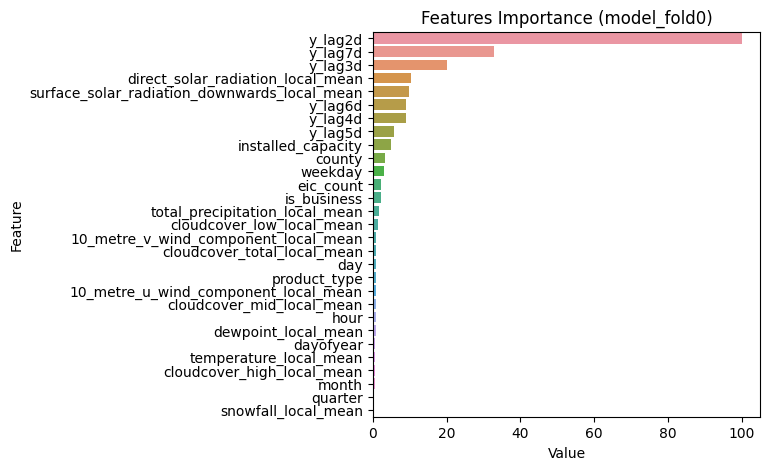

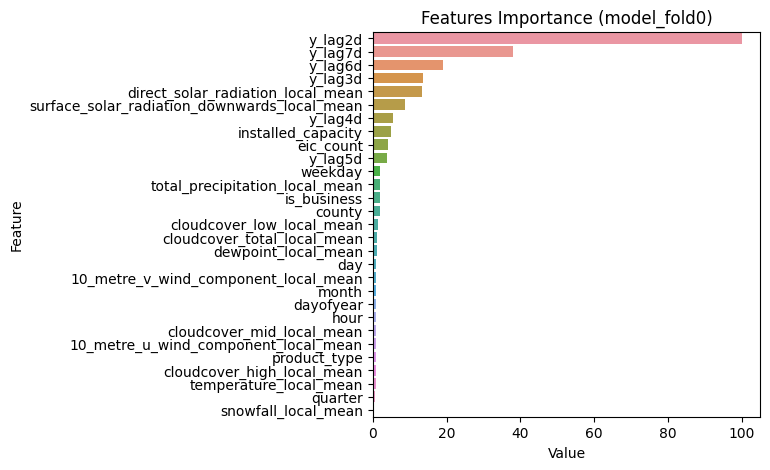

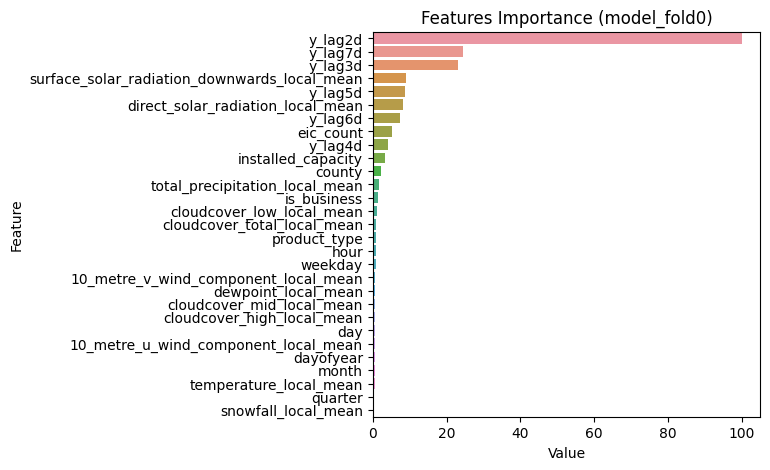

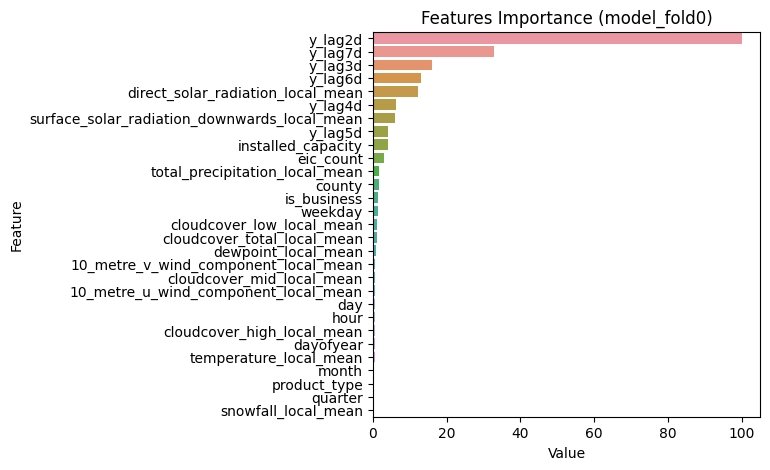

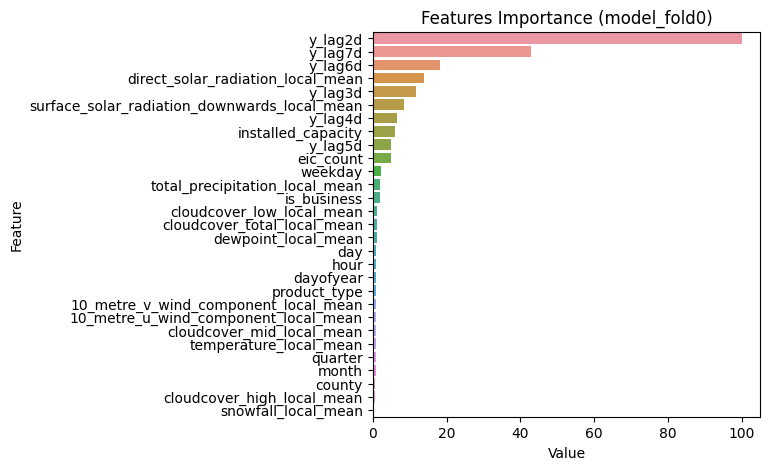

cons


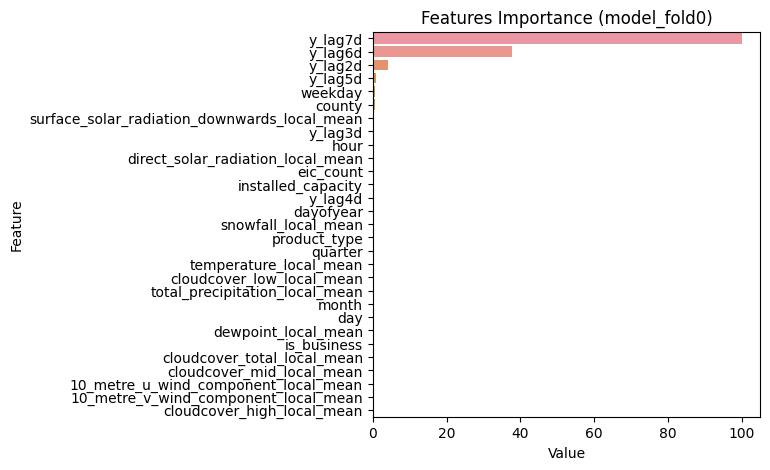

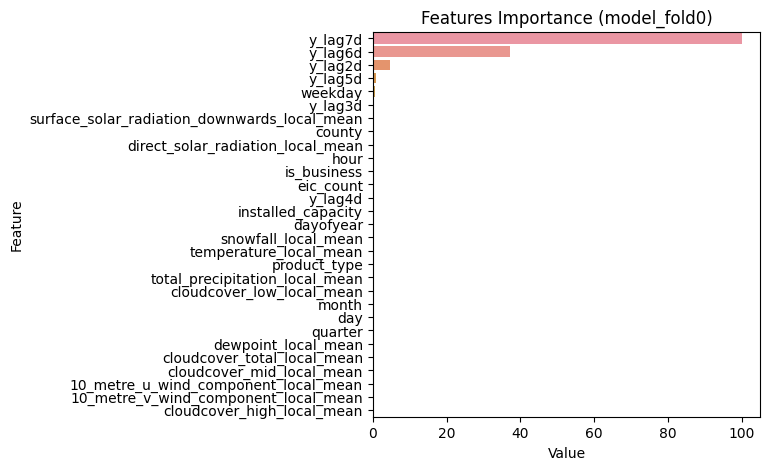

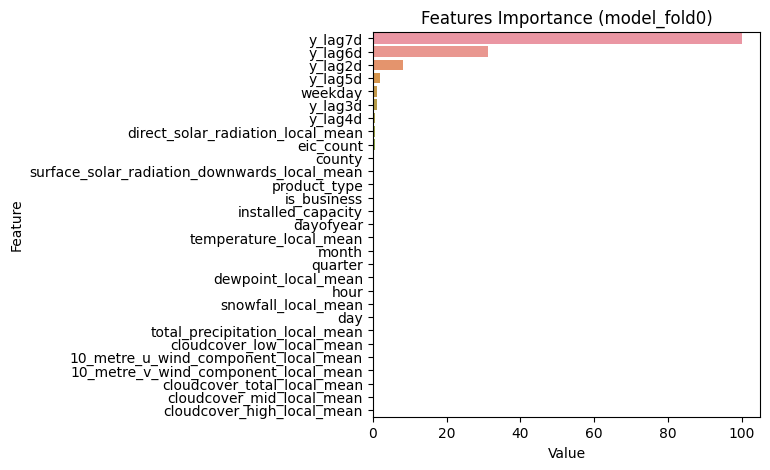

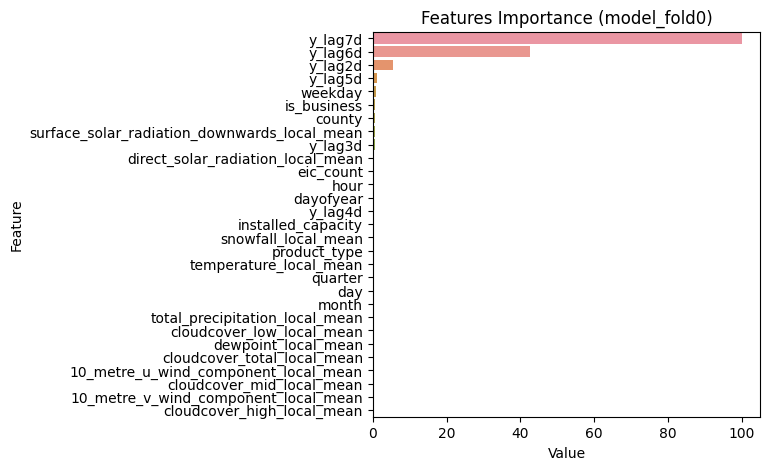

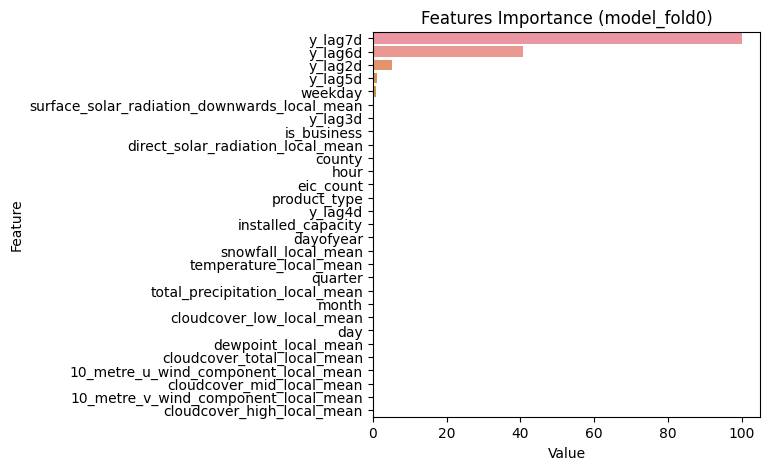

In [37]:
for k, models_ in models.items():
    print(k)
    for model in models_:
        _plot_feat_imp(model,  "model_fold0")

In [162]:
df["oof_pred"] = oof
# df["oof_pred"] = df["oof_pred"].clip(0)
mean_absolute_error(df[TGT_COL], df["oof_pred"])

97.59782676528664

In [164]:
prf_prod = []
prf_cons = []
for fold, (tr_idx, val_idx) in enumerate(cv.split(df, groups=df[UNIT_ID_COL])):
    df_val = df.iloc[val_idx].reset_index(drop=True)
    cons_mask = df_val["is_consumption"] == 1
    df_val_prod = df_val.loc[~cons_mask]
    df_val_cons = df_val.loc[cons_mask]    
    
    # print(fold)
    prf_prod.append(mean_absolute_error(df_val_prod[TGT_COL], df_val_prod["oof_pred"]))
    prf_cons.append(mean_absolute_error(df_val_cons[TGT_COL], df_val_cons["oof_pred"]))    

In [166]:
np.mean(prf_prod), np.mean(prf_cons)

(25.97568716926287, 166.02678602913514)

In [167]:
(np.mean(prf_prod) + np.mean(prf_cons)) / 2

96.001236599199

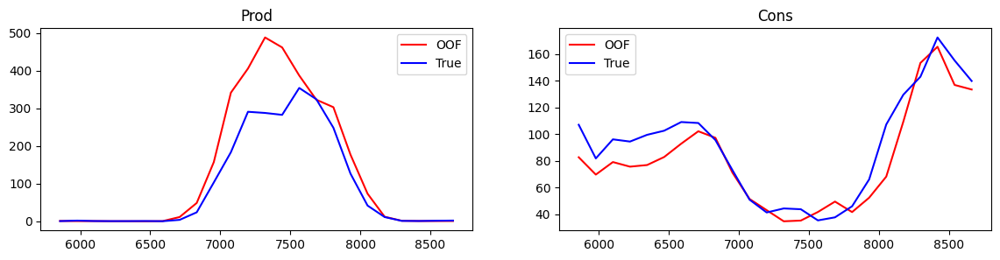

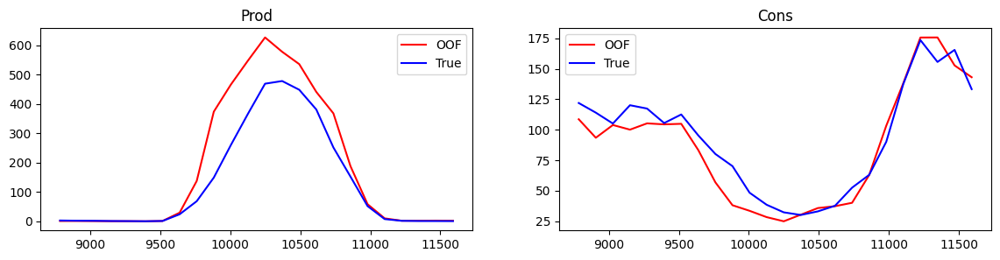

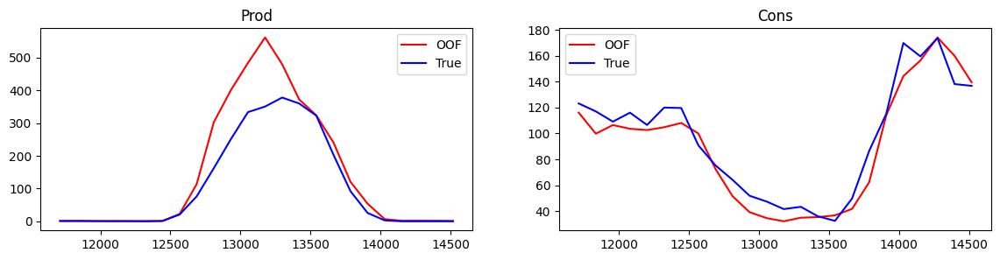

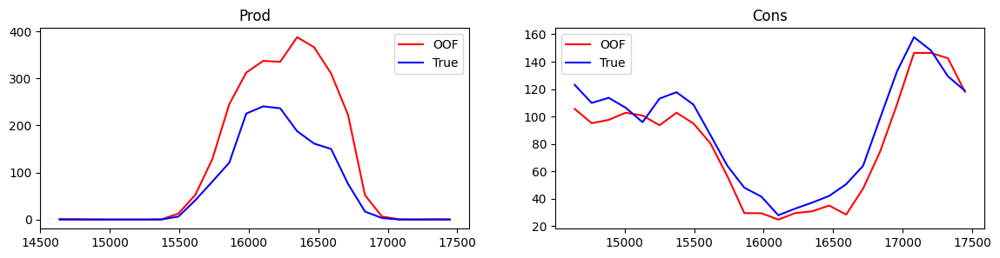

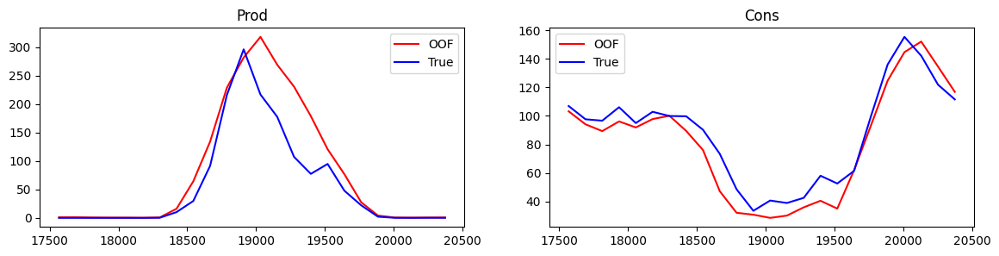

...

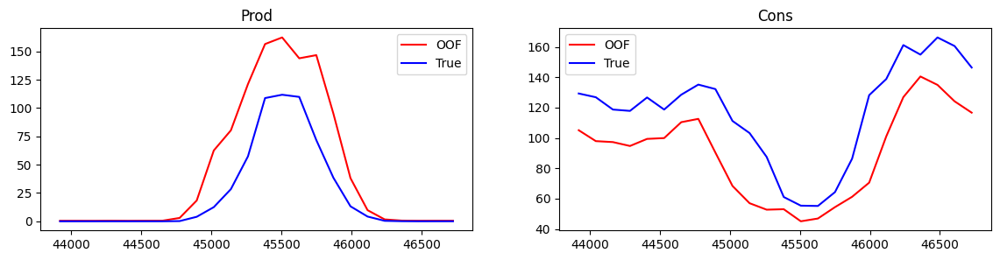

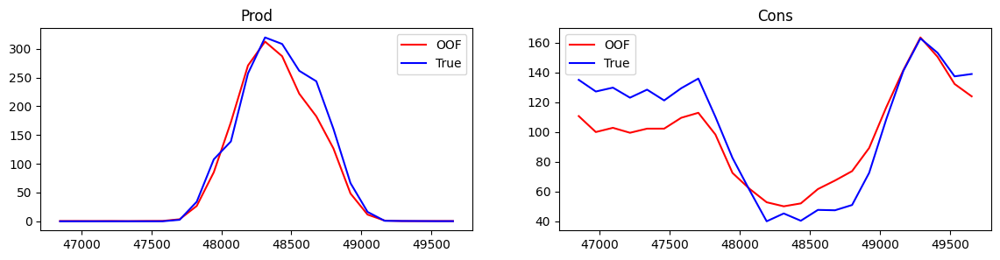

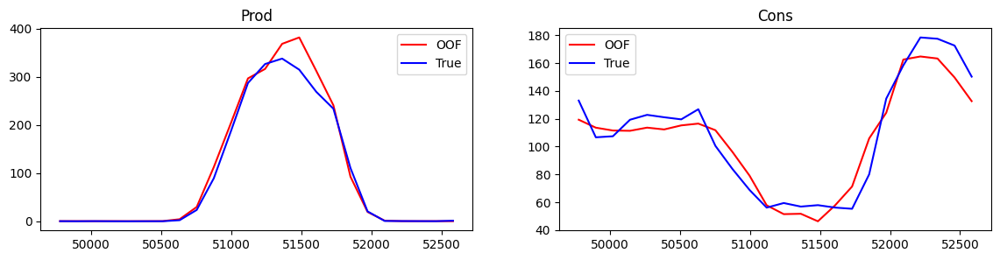

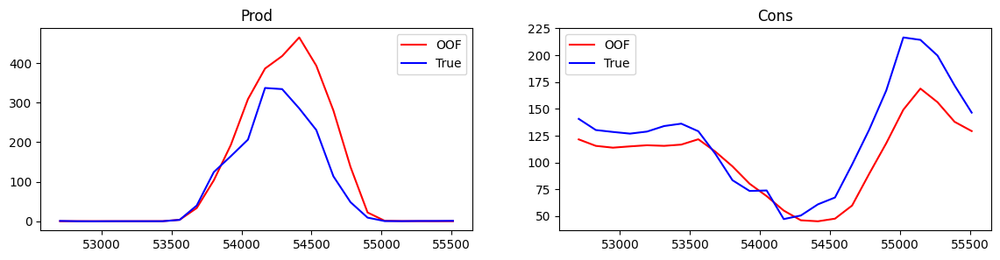

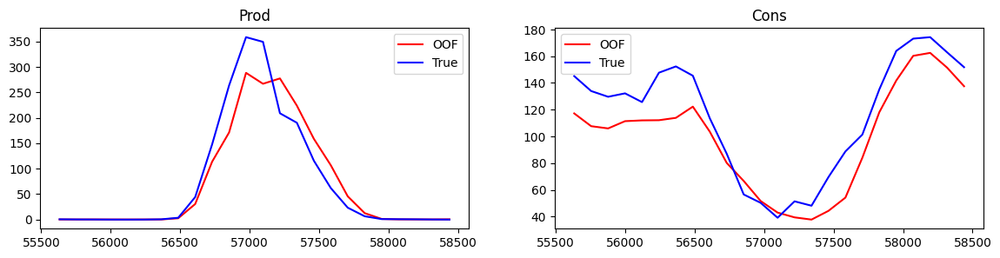

In [171]:
df_demo = df[df[UNIT_ID_COL] == 0]
for dbi in range(2, 20):
    df_demo_ = df_demo[df_demo[DBI] == dbi]
    df_demo_prod = df_demo_[df_demo_["is_consumption"]==0]
    df_demo_cons = df_demo_[df_demo_["is_consumption"]==1]
    
    fig, axes = plt.subplots(figsize=(14, 3), nrows=1, ncols=2)
    axes[0].plot(df_demo_prod["oof_pred"], "r-", label="OOF")
    axes[0].plot(df_demo_prod[TGT_COL], "b-", label="True")
    axes[0].set_title("Prod")
    axes[0].legend()
    axes[1].plot(df_demo_cons["oof_pred"], "r-", label="OOF")
    axes[1].plot(df_demo_cons[TGT_COL], "b-", label="True")
    axes[1].set_title("Cons")
    axes[1].legend()
    plt.show()

In [173]:
df.groupby(["is_consumption", "month"]).apply(lambda x: mean_absolute_error(x[TGT_COL], x["oof_pred"]))

is_consumption  month
0               1          3.735578
                2          9.927734
                3         28.493855
                4         45.411694
                5         63.450475
                6         44.596625
                7         45.010577
                8         40.303139
                9         30.204556
                10        17.256040
                11         5.705187
                12         3.098945
1               1        210.119071
                2        204.495705
                3        195.554514
                4        161.274034
                5        142.735513
                6        131.875870
                7        127.406134
                8        150.843358
                9        154.013557
                10       149.983079
                11       173.077151
                12       181.041717
dtype: float64

In [ ]:
df_y.filter((pl.col(UNIT_ID_COL) == 0) & (pl.col("is_consumption") == 0))

prediction_unit_id,datetime,target,is_consumption
i64,datetime[μs],f64,i64
0,2021-09-01 00:00:00,0.713,0
0,2021-09-01 01:00:00,1.132,0
0,2021-09-01 02:00:00,0.49,0
0,2021-09-01 03:00:00,0.496,0
0,2021-09-01 04:00:00,0.149,0
0,2021-09-01 05:00:00,0.298,0
0,2021-09-01 06:00:00,1.271,0
0,2021-09-01 07:00:00,22.122,0
0,2021-09-01 08:00:00,64.257,0


In [18]:
df_y = train.select([UNIT_ID_COL, "datetime", TGT_COL, "is_consumption"])
df_y.head(10)

prediction_unit_id,datetime,target,is_consumption
i64,datetime[μs],f64,i64
0,2021-09-01 00:00:00,0.713,0
0,2021-09-01 00:00:00,96.59,1
1,2021-09-01 00:00:00,0.0,0
1,2021-09-01 00:00:00,17.314,1
2,2021-09-01 00:00:00,2.904,0
2,2021-09-01 00:00:00,656.859,1
3,2021-09-01 00:00:00,0.0,0
3,2021-09-01 00:00:00,59.0,1
4,2021-09-01 00:00:00,0.0,0


In [10]:
class MonthlyKFold:
    def __init__(self, n_splits=3):
        self.n_splits = n_splits
        
    def split(self, X, y, groups=None):
        dates = 12 * X["year"] + X["month"]
        timesteps = sorted(dates.unique().tolist())
        X = X.reset_index()
        
        for t in timesteps[-self.n_splits:]:
            idx_train = X[dates.values < t].index
            idx_test = X[dates.values == t].index
            
            yield idx_train, idx_test
            
    def get_n_splits(self, X, y, groups=None):
        return self.n_splits
cv = MonthlyKFold(1)

In [11]:
train = train.with_columns([
    pl.col("datetime").dt.year().alias("year"),
    pl.col("datetime").dt.month().alias("month"),
])

In [12]:
df = train.to_pandas()

In [13]:
for tr_idx, val_idx in cv.split(df, y=None):
    df_tr, df_val = df.iloc[tr_idx], df.iloc[val_idx]
    print(df_tr.shape, df_tr["datetime"].min(), df_tr["datetime"].max())
    print(df_val.shape, df_val["datetime"].min(), df_val["datetime"].max())    

(1918656, 12) 2021-09-01 00:00:00 2023-04-30 23:00:00
(99696, 12) 2023-05-01 00:00:00 2023-05-31 23:00:00


In [4]:
train["datetime"].dt.year()

datetime
i32
2021
2021
2021
2021
2021
2021
2021
2021
2021


In [14]:
train["datetime"].max()

datetime.datetime(2023, 5, 31, 23, 0)

In [16]:
train["datetime"].min()

datetime.datetime(2021, 9, 1, 0, 0)

In [45]:
import pandas as pd
import polars as pl 

In [55]:
fwth_v1 = pd.read_csv("./data/raw_v1/forecast_weather.csv", engine="python")
fwth_v2 = pd.read_csv("./data/raw_v2/forecast_weather.csv", engine="python")
fwth_v3 = pd.read_csv("./data/raw/forecast_weather.csv", engine="python")

In [56]:
fwth_v1.head(2)

,latitude,longitude,origin_datetime,hours_ahead,temperature,dewpoint,cloudcover_high,cloudcover_low,cloudcover_mid,cloudcover_total,10_metre_u_wind_component,10_metre_v_wind_component,data_block_id,forecast_datetime,direct_solar_radiation,surface_solar_radiation_downwards,snowfall,total_precipitation
0,57.6,21.7,2021-09-01 00:00:00+00:00,1,15.655786,11.553613,0.904816,0.019714,0.0,0.905899,-0.411328,-9.106137,1,2021-09-01 01:00:00+00:00,0.0,0.0,0.0,0.0
1,57.6,22.2,2021-09-01 00:00:00+00:00,1,13.003931,10.689844,0.886322,0.004456,0.0,0.886658,0.206347,-5.355405,1,2021-09-01 01:00:00+00:00,0.0,0.0,0.0,0.0


In [57]:
fwth_v2.head(2)

,latitude,longitude,origin_datetime,hours_ahead,temperature,dewpoint,cloudcover_high,cloudcover_low,cloudcover_mid,cloudcover_total,10_metre_u_wind_component,10_metre_v_wind_component,data_block_id,forecast_datetime,direct_solar_radiation,surface_solar_radiation_downwards,snowfall,total_precipitation
0,57.6,21.7,2021-08-31 23:00:00+00:00,1,15.655786,11.553613,0.904816,0.019714,0.0,0.905899,-0.411328,-9.106137,1,2021-09-01 00:00:00+00:00,0.0,0.0,0.0,0.0
1,57.6,22.2,2021-08-31 23:00:00+00:00,1,13.003931,10.689844,0.886322,0.004456,0.0,0.886658,0.206347,-5.355405,1,2021-09-01 00:00:00+00:00,0.0,0.0,0.0,0.0


In [58]:
fwth_v3.head(2)

,latitude,longitude,origin_datetime,hours_ahead,temperature,dewpoint,cloudcover_high,cloudcover_low,cloudcover_mid,cloudcover_total,10_metre_u_wind_component,10_metre_v_wind_component,data_block_id,forecast_datetime,direct_solar_radiation,surface_solar_radiation_downwards,snowfall,total_precipitation
0,57.6,21.7,2021-08-31 23:00:00+00:00,1,15.655786,11.553613,0.904816,0.019714,0.0,0.905899,-0.411328,-9.106137,1,2021-09-01 00:00:00+00:00,0.0,0.0,0.0,0.0
1,57.6,22.2,2021-08-31 23:00:00+00:00,1,13.003931,10.689844,0.886322,0.004456,0.0,0.886658,0.206347,-5.355405,1,2021-09-01 00:00:00+00:00,0.0,0.0,0.0,0.0


In [59]:
fwth_v2.equals(fwth_v3)

True

In [63]:
slc_cols = [c for c in fwth_v1.columns if c not in ["origin_datetime", "forecast_datetime"]]
fwth_v1[slc_cols].equals(fwth_v2[slc_cols])

True